<ul><font size = 5 color='Orange'>
Learning Goals</font>
<font color = 'Orange'><li>Understand the structure of a web page.</li>
<li>Understand how to use Beautiful soup to scrape content from web pages.</li>
<li>Feel comfortable storing and manipulating the content in various formats.</li>
<li>Understand how to convert structured format into a Pandas DataFrame.</li>
</font>
</ul>

<font size = 4 color = "green">For this homework your job is to find a web-site from which you will extract the data, we are suggestioning for a local-site like time.mk, sitel.mk, vecer.mk, panacea.mk, reklama5.mk, etc. Accordinly with the choice you've made make a quick summary why did you use especially this web-site and what is the part of interest.</font>

#<font color = 'Orange'>Explain the Web-site that you will be using in this homework.</font>

In the following text-box answer the questions:
<li>What data you will be extracting and why?</li>
<li>Add a screenshot of the web-site that you will be scraping</li>



I will be extracting data for GPUs from the website Setec for purposes of visualizing the prices.

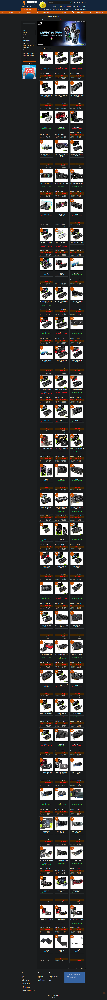

# <font color='Orange'>Requirements specified for Web Scraping</font>


Import all libraries and modules that you are going to use.

In [ ]:
import re

import requests
import bs4
import pandas as pd


# <font color = 'Orange'> Start the scraping by sending HTTP request</font> 

 **Fetch a website's content - send request**

In [ ]:
url = 'https://setec.mk/index.php?route=product/category&path=10019_10020_10025&sort=p.price&order=DESC&limit=100'

fetch = requests.get(url)


**Get the response-status code and see:**
<li>If the code starts with a 2, it means the request was successful.



In [ ]:
if fetch.status_code / 100 == 2:
  print('success')
else:
  print(f'failed: {fetch.status_code}')
  

success


# <font color = 'orange'>Parse the HTML with BeautifulSoup</font>

Beautiful Soup is a Python library for pulling data out of HTML and XML files. It works with your favorite parser to provide idiomatic ways of navigating, searching, and modifying the parse tree. It commonly saves programmers hours or days of work. 


**Parse using BeautifulSoap**




In [ ]:
soup = bs4.BeautifulSoup(fetch.text)


**Print the HTML code that you get**

In [ ]:
soup.prettify()


'<!DOCTYPE html>\n<html class="responsive" lang="mk">\n <head>\n  <title>\n   Графички Карти\n  </title>\n  <meta content="1200" property="og:image:width"/>\n  <meta content="630" property="og:image:height"/>\n  <meta content="image/jpeg" property="og:image:type"/>\n  <meta content="" property="og:title"/>\n  <meta content="product" property="og:type"/>\n  <meta content="https://www.setec.mk/image/catalog/Promo/setec_logo_modal.jpg" property="og:image"/>\n  <meta content="Сетек | Сè од техника" name="description" property="og:description"/>\n  <meta content="" name="keywords"/>\n  <base href="https://setec.mk/"/>\n  <meta charset="utf-8"/>\n  <meta content="IE=edge" http-equiv="X-UA-Compatible"/>\n  <meta content="width=device-width, initial-scale=1.0" name="viewport"/>\n  <link href="https://setec.mk/index.php?route=product/category&amp;path=10025" rel="canonical"/>\n  <link href="https://setec.mk/image/catalog/favicon.png" rel="icon"/>\n  <noscript>\n   <img height="1" src="https://w

# <font color='Orange'>Extracting data</font>

From the printed HTML code search for the data you need for building the dataset, find the classes for groupby option.

**In the following text-box write the attributes you are going to use**

<font color='red'> You need to extract a minimum of four features (lists/columns) from the web site (example: titles, posting time, comments, likes, ...)</font>

`add your attributes here for building the dataset`

**Try to select the first element from your attributes. Find out from the html code what part do you need.**

In [ ]:
gpus = soup.select('div.product')


**Add as many codeboxes as you need for selecting all the html elements**

In [ ]:
def getPrice(string):
  return re.search(r'\d+', string.replace(',', '')).group(0)


In [ ]:
info = []

for gpu in gpus:
  link = gpu.select_one('div[class="image "] a')['href']

  sale_element = gpu.select_one('.sale')

  sale = sale_element.text if sale_element else None
  image = gpu.select_one('.zoom-image-effect')['src']
  name = gpu.select_one('.name').text
  code = getPrice(gpu.select_one('.shifra').text)
  stock = bool(gpu.select_one('.ima_zaliha'))

  price_element_1 = gpu.select_one('.cena_za_kesh')
  price_element_2 = gpu.select_one('.price-old-new')

  price = getPrice(price_element_1.text if price_element_1 else price_element_2.text)

  premium_price_element = gpu.select_one('.price-new-new')
  premium_price = getPrice(premium_price_element.text) if premium_price_element else None

  rates = [x.text for x in gpu.select('.klub-rata-suma')]

  if rates:
    rate_12 = getPrice(rates[0])
    rate_24 = getPrice(rates[1])

  info.append({
      'link': link,
      'sale': sale,
      'image': image,
      'name': name,
      'code': code,
      'stock': stock,
      'price': price,
      'premium_price': premium_price,
      'rate_12': rate_12,
      'rate_24': rate_24
  })


**Create lists with the extracted data from the html elements that you selected**

**Print all lists that are containing the elements**

**Check if all lists are the same size**

# <font color='Orange'>Create a Pandas DataFrame</font> 


**Create the DataFrame from the lists you get and name your *Columns***

In [ ]:
df = pd.DataFrame(info)


**Print the dataset you obtain**

In [ ]:
df


,link,sale,image,name,code,stock,price,premium_price,rate_12,rate_24
0,https://setec.mk/index.php?route=product/produ...,-8%,https://setec.mk/image/cache/catalog/Product/1...,ASUS ROG-STRIX-RTX4090-O24G-GAMING,17384,False,159999,147999,12949,6783
1,https://setec.mk/index.php?route=product/produ...,-7%,https://setec.mk/image/cache/catalog/Product/1...,ASUS TUF-RTX3090TI-24G-GAMING,17378,False,154999,143999,12599,6600
2,https://setec.mk/index.php?route=product/produ...,-6%,https://setec.mk/image/cache/catalog/Product/1...,ASUS TUF-RTX3090TI-O24G-GAMING,17377,False,148999,139999,12249,6417
3,https://setec.mk/index.php?route=product/produ...,-7%,https://setec.mk/image/cache/catalog/Product/1...,ASUS TUF-RTX4090-O24G-GAMING,17383,False,149999,138999,12162,6371
4,https://setec.mk/index.php?route=product/produ...,-4%,https://setec.mk/image/cache/catalog/Product/1...,ZOTAC GeForce RTX3090 Trinity 24GB,17329,True,124999,119999,10499,5500
...,...,...,...,...,...,...,...,...,...,...
88,https://setec.mk/index.php?route=product/produ...,-10%,https://setec.mk/image/cache/catalog/Product/1...,AFOX Radeon R5 230,17270,True,3099,2799,245,129
89,https://setec.mk/index.php?route=product/produ...,-7%,https://setec.mk/image/cache/catalog/Product/1...,AFOX NVIDIA GT610-PCI-E 1GB DDR3 (64-bit),17352,True,2999,2799,245,129
90,https://setec.mk/index.php?route=product/produ...,None,https://setec.mk/image/cache/catalog/Product/2...,CoolerMaster Riser Cable PCI-E 3.0 x16 - 200mm,22825,True,2599,None,217,109
91,https://setec.mk/index.php?route=product/produ...,-4%,https://setec.mk/image/cache/catalog/Product/2...,CoolerMaster Riser Cable PCI-E 3.0 x16 - 300mm,22794,True,2599,2499,219,115


# <font color = 'Green'>Advanced part</font>

<font color = 'orange'>This part is not mandatory and is intended for those who want to expand their knowledge in this field</font>

There are other libraries in Python that can be used to scrape a website. Some examples are Scrapy (https://scrapy.org/) and Selenium (https://selenium-python.readthedocs.io/).




## <font color = 'Green'>Extra task 1: Selenium</font> 
For the extra task you will need to take a look of the Selenium library. Here is a quick intro to this library and what features it has.

Selenium is a robust framework designed to automate tests for Web Applications. It provides a way for the developer to write tests in several popular programming languages such as C#, Java, Python, Ruby, etc. This framework is developed to perform browser automation. Selenium is an excellent choice when you want to deal with Core Javascript-based web Applications and make browser automation with AJAX/PJAX Requests.
 
View these links for more details: 

*   https://selenium-python.readthedocs.io/installation.html
*   https://selenium-python.readthedocs.io/getting-started.html
*   https://pypi.org/project/selenium-requests/
*   https://pypi.org/project/selenium-wire/

Starting code id given below.

<font color ="red"> During the laboratory exercise, will be defined which side and what will need to be extracted using Selenium library</font>



In [ ]:
#requirements for colab
# install chromium, its driver, and selenium
!apt update
!apt install chromium-chromedriver
!pip install selenium
# set options to be headless, ..

# open it, go to a website, and get results
#divs = wd.find_element(By.TAG_NAME, 'div')

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease
Hit:2 http://archive.ubuntu.com/ubuntu bionic InRelease
Ign:3 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:4 http://archive.ubuntu.com/ubuntu bionic-updates InRelease
Hit:5 http://security.ubuntu.com/ubuntu bionic-security InRelease
Hit:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Hit:7 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:8 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Hit:9 http://archive.ubuntu.com/ubuntu bionic-backports InRelease
Hit:10 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Hit:11 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Hit:12 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Reading package lists... Done
Building dependency tree       
Reading state infor

In [ ]:
from selenium import webdriver
from selenium.webdriver.common.by import By


In [ ]:
options = webdriver.ChromeOptions()
options.add_argument('--headless')
options.add_argument('--no-sandbox')
options.add_argument('--disable-dev-shm-usage')

wd = webdriver.Chrome(options=options)
wd.get("https://play.google.com/store/movies/details/Don_t_Worry_Darling?id=pckeqRD0Leo.P&hl=en&gl=US")


In [ ]:
title = wd.find_element(By.CSS_SELECTOR, 'h1[itemprop="name"] > span').text
reviews = wd.find_element(By.CSS_SELECTOR, '.g1rdde').text

button = wd.find_element(By.CSS_SELECTOR, '#yDmH0d > c-wiz.SSPGKf.Czez9d > div > div > div.tU8Y5c > div.wkMJlb.YWi3ub > div > div.qZmL0 > c-wiz:nth-child(3) > section > div > div > div:nth-child(5) > div > div > button')
wd.execute_script('arguments[0].click()', button)

comments_box = wd.find_element(By.CSS_SELECTOR, '#yDmH0d > div.VfPpkd-Sx9Kwc.cC1eCc.UDxLd.PzCPDd.HQdjr.VfPpkd-Sx9Kwc-OWXEXe-FNFY6c > div.VfPpkd-wzTsW > div > div > div')
comments = [e.text for e in comments_box.find_elements(By.CSS_SELECTOR, 'header + div')]

print(f'title: {title}')
print(f'reviews: {reviews}')
print(f'comments: {comments}')


title: Don’t Worry Darling
reviews: 
comments: ['This movie was honestly a roller coaster. My friend and his girlfriend (who we are now just ‘mutual friends’ due to an incident, went to go see this movie. She put cellophane wrap around her head during one part and I thought about doing the same as this movie stunk. And not the stink like ‘oh you just didn’t get it’ oh hell no it was poorly explained except for the corvette that was cool. 0/5 atleast the popcorn was good', 'good movie', 'i love harry styles']


In [ ]:
import pandas as pd

df = pd.DataFrame([{
    'title': title,
    'reviews': reviews,
    'comments': '|||'.join(comments)
}])

df


,title,reviews,comments
0,Don’t Worry Darling,,This movie was honestly a roller coaster. My f...
